####1: ORGANIZE AND CLEAN THE DATA

In [0]:
## Installed the imbalanced-learn package because it is not included in the standard Python libraries or in popular distributions like Anaconda by default  
%pip install imbalanced-learn


Python interpreter will be restarted.
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 2.2.0
    Not uninstalling threadpoolctl at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-a7f87e0e-6def-45fd-ac7b-d8e7992597a1
    Can't uninstall 'threadpoolctl'. No files were found to uninstall.
  Attempting uninstall: joblib
    Found existing installation: joblib 1.0.1
    Not uninstalling joblib at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-a7f87e0e-6def-45fd-ac7b-d8e7992597a1
    Can't uninstall 'joblib'. No files were found to uninstall.
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.2
    Not uninstalling scikit-learn at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-a7f87e0e-6def-45fd-ac7b-d8e7992597a1
    Can't uninst

In [0]:
# Imported Necessary libraries
from pyspark.sql.functions import col, sum as _sum  # Used for selecting and aggregating Spark DataFrame columns
import pandas as pd  # Used for handling tabular data, especially during SMOTE (via sklearn/imblearn)
from pyspark.sql.functions import avg  # Used to calculate the average (mean) in Spark
from pyspark.sql.functions import percentile_approx  # Used to calculate approximate percentiles (e.g. median)
from pyspark.ml.feature import StringIndexer  # Converts categorical string columns into numerical indices
from pyspark.ml import Pipeline  # Used to chain multiple transformers and estimators into a single pipeline
from pyspark.sql.functions import skewness  # Calculates skewness to measure data distribution asymmetry
from pyspark.sql import Row  # Allows creation of custom Spark rows for schema definition
from pyspark.ml.feature import VectorAssembler  # Combines multiple columns into a single feature vector
from pyspark.ml.stat import Correlation  # Used to compute correlation matrix in Spark
from pyspark.sql.functions import col  # Redundant import; selects columns in Spark DataFrames
import numpy as np  # Provides numerical operations, especially for model metrics and arrays
import seaborn as sns  # Used for advanced statistical data visualization (e.g. heatmaps)
import matplotlib.pyplot as plt  # Used for plotting graphs like histograms, boxplots, confusion matrix
from pyspark.ml.clustering import KMeans  # Used for unsupervised clustering via KMeans algorithm
from pyspark.ml.evaluation import ClusteringEvaluator  # Evaluates clustering performance using Silhouette score
from imblearn.over_sampling import SMOTE  # Performs synthetic sampling to balance imbalanced classes
from pyspark.sql import SparkSession  # Initializes Spark context and session
from pyspark.ml.classification import RandomForestClassifier  # Used for building Random Forest classification model
from pyspark.ml.evaluation import MulticlassClassificationEvaluator  # Evaluates classification model metrics (accuracy, F1)
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay  # Computes and displays confusion matrix
from sklearn.metrics import cohen_kappa_score  # Computes Cohen’s Kappa score to evaluate classification agreement
import time  # Used to measure and compare execution time of code blocks



In [0]:
# Load CSV with header and infer types
financial_df = spark.read.csv("dbfs:/FileStore/tables/financial_risk_assessment.csv", header=True, inferSchema=True)

# Check schema & sample
financial_df.printSchema()
display(financial_df)


root
 |-- Age: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Education Level: string (nullable = true)
 |-- Marital Status: string (nullable = true)
 |-- Income: double (nullable = true)
 |-- Credit Score: double (nullable = true)
 |-- Loan Amount: double (nullable = true)
 |-- Loan Purpose: string (nullable = true)
 |-- Employment Status: string (nullable = true)
 |-- Years at Current Job: integer (nullable = true)
 |-- Payment History: string (nullable = true)
 |-- Debt-to-Income Ratio: double (nullable = true)
 |-- Assets Value: double (nullable = true)
 |-- Number of Dependents: double (nullable = true)
 |-- City: string (nullable = true)
 |-- State: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Previous Defaults: double (nullable = true)
 |-- Marital Status Change: integer (nullable = true)
 |-- Risk Rating: string (nullable = true)



Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
49,Male,PhD,Divorced,72799.0,688.0,45713.0,Business,Unemployed,19,Poor,0.15431329631270066,120228.0,0.0,Port Elizabeth,AS,Cyprus,2.0,2,Low
57,Female,Bachelor's,Widowed,null,690.0,33835.0,Auto,Employed,6,Fair,0.14891964322471593,55849.0,0.0,North Catherine,OH,Turkmenistan,3.0,2,Medium
21,Non-binary,Master's,Single,55687.0,600.0,36623.0,Home,Employed,8,Fair,0.36239801732546084,180700.0,3.0,South Scott,OK,Luxembourg,3.0,2,Medium
59,Male,Bachelor's,Single,26508.0,622.0,26541.0,Personal,Unemployed,2,Excellent,0.45496438073379486,157319.0,3.0,Robinhaven,PR,Uganda,4.0,2,Medium
25,Non-binary,Bachelor's,Widowed,49427.0,766.0,36528.0,Personal,Unemployed,10,Fair,0.14324242402046136,287140.0,null,New Heather,IL,Namibia,3.0,1,Low
30,Non-binary,PhD,Divorced,null,717.0,15613.0,Business,Unemployed,5,Fair,0.2959844500430854,null,4.0,Brianland,TN,Iceland,3.0,1,Medium
31,Non-binary,Master's,Widowed,45280.0,672.0,6553.0,Personal,Self-employed,1,Good,0.37888993741531785,null,null,West Lindaview,MD,Bouvet Island (Bouvetoya),0.0,1,Low
18,Male,Bachelor's,Widowed,93678.0,null,null,Business,Unemployed,10,Poor,0.3966357236164678,246597.0,1.0,Melissahaven,MA,Honduras,1.0,1,Low
32,Non-binary,Bachelor's,Widowed,20205.0,710.0,null,Auto,Unemployed,4,Fair,0.335964977578598,227599.0,0.0,North Beverly,DC,Pitcairn Islands,4.0,2,Low
55,Male,Bachelor's,Married,32190.0,600.0,29918.0,Personal,Self-employed,5,Excellent,0.48433330455936785,130507.0,4.0,Davidstad,VT,Thailand,null,2,Low


In [0]:
# print total number of rows and columns 
print(f"Rows: {financial_df.count()}, Columns: {len(financial_df.columns)}")

# retrive the column names 
financial_df.columns


Rows: 15000, Columns: 20
Out[3]: ['Age',
 'Gender',
 'Education Level',
 'Marital Status',
 'Income',
 'Credit Score',
 'Loan Amount',
 'Loan Purpose',
 'Employment Status',
 'Years at Current Job',
 'Payment History',
 'Debt-to-Income Ratio',
 'Assets Value',
 'Number of Dependents',
 'City',
 'State',
 'Country',
 'Previous Defaults',
 'Marital Status Change',
 'Risk Rating']

#####We have location based columns like country, city and state which are not necessary for model building we drop those columns 

In [0]:

# Drop City, State, Country from the DataFrame
financial_df = financial_df.drop("City", "State", "Country")

# print total number of rows and columns after deleting location based columns 
print(f"Rows: {financial_df.count()}, Columns: {len(financial_df.columns)}")


Rows: 15000, Columns: 17


#####Now we have 15000 observations and 17 variables 

##### Deal with Null Values

In [0]:
# Step 1: Count null values per column
null_counts = financial_df.select([_sum(col(c).isNull().cast("int")).alias(c) for c in financial_df.columns])

# Step 2: Convert to Pandas to display as a vertical table form
null_df = null_counts.toPandas().T.reset_index()
null_df.columns = ["Column", "Null Count"]

# Step 3: Show as Databricks table
display(pd.DataFrame(null_df))


Column,Null Count
Age,0
Gender,0
Education Level,0
Marital Status,0
Income,2250
Credit Score,2250
Loan Amount,2250
Loan Purpose,0
Employment Status,0
Years at Current Job,0


#####The percentage of null values is 15% so we replace null values of 'Income', 'Credit Score', 'Loan Amount', 'Assets Value' columns with mean and for 'number of dependents' and 'previous default' columns we use median to replace null values. Why we use median for these 2 columns because these 2 columns are containing discrete values if we replace null values with mean the values of null values are continous which can be impact on the EDA and Accuracy in model building so best option is we replace those 2 column's null values with median. 

In [0]:
# convert null values with mean 
numeric_cols = ['Income', 'Credit Score', 'Loan Amount', 'Assets Value']

for col_name in numeric_cols:
    mean_val = financial_df.select(avg(col(col_name))).first()[0]
    financial_df = financial_df.fillna({col_name: mean_val})

# After replacement, we will check either all values replaced correctly or is there any value left
null_counts = financial_df.select([_sum(col(c).isNull().cast("int")).alias(c) for c in financial_df.columns])

# Convert to Pandas to display as a vertical table form
null_df = null_counts.toPandas().T.reset_index()
null_df.columns = ["Column", "Null Count"]

# Show as Databricks table
display(pd.DataFrame(null_df))

Column,Null Count
Age,0
Gender,0
Education Level,0
Marital Status,0
Income,0
Credit Score,0
Loan Amount,0
Loan Purpose,0
Employment Status,0
Years at Current Job,0


In [0]:
# Get medians
dependents_median = financial_df.select(percentile_approx("Number of Dependents", 0.5)).first()[0]
defaults_median = financial_df.select(percentile_approx("Previous Defaults", 0.5)).first()[0]

financial_df = financial_df.fillna({
    "Number of Dependents": dependents_median,
    "Previous Defaults": defaults_median
})

# After median replacement, we will check either all values replaced correctly or is there any value left
null_counts = financial_df.select([_sum(col(c).isNull().cast("int")).alias(c) for c in financial_df.columns])

# Convert to Pandas to display as a vertical table form
null_df = null_counts.toPandas().T.reset_index()
null_df.columns = ["Column", "Null Count"]

# Show as Databricks table
display(pd.DataFrame(null_df))


Column,Null Count
Age,0
Gender,0
Education Level,0
Marital Status,0
Income,0
Credit Score,0
Loan Amount,0
Loan Purpose,0
Employment Status,0
Years at Current Job,0


#####Convert categorical variable into numerical by using StringIndexer in PySpark because ML models can not work directly with text so in Spark stringindexer convert text into index numbers based on its frequency and Spark ML works with immutable DataFrames, so it adds numerical columns in dataframe without converting existing columns like in R.

In [0]:
#make a list of string variables so we convert them easily 
categorical_cols = [
    "Gender",
    "Education Level",
    "Marital Status",
    "Loan Purpose",
    "Employment Status",
    "Payment History",
    "Risk Rating" 
]

# Create a StringIndexer for each categorical column
string_indexers = [
    StringIndexer(inputCol=col, outputCol=col + "_idx")
    for col in categorical_cols
]

# Combine indexers into a single pipeline
pipeline = Pipeline(stages=string_indexers)

# Fit and transform the DataFrame
financial_df = pipeline.fit(financial_df).transform(financial_df)


In [0]:
# Check schema & sample
financial_df.printSchema()

# print total number of rows and columns after adding new varaibles 
print(f"Rows: {financial_df.count()}, Columns: {len(financial_df.columns)}")



root
 |-- Age: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Education Level: string (nullable = true)
 |-- Marital Status: string (nullable = true)
 |-- Income: double (nullable = false)
 |-- Credit Score: double (nullable = false)
 |-- Loan Amount: double (nullable = false)
 |-- Loan Purpose: string (nullable = true)
 |-- Employment Status: string (nullable = true)
 |-- Years at Current Job: integer (nullable = true)
 |-- Payment History: string (nullable = true)
 |-- Debt-to-Income Ratio: double (nullable = true)
 |-- Assets Value: double (nullable = false)
 |-- Number of Dependents: double (nullable = false)
 |-- Previous Defaults: double (nullable = false)
 |-- Marital Status Change: integer (nullable = true)
 |-- Risk Rating: string (nullable = true)
 |-- Gender_idx: double (nullable = false)
 |-- Education Level_idx: double (nullable = false)
 |-- Marital Status_idx: double (nullable = false)
 |-- Loan Purpose_idx: double (nullable = false)
 |-- Employment

In [0]:
# Select the top 5 rows to check how numerical variables assigned values
financial_df.select("Gender", "Gender_idx", "Education Level","Education Level_idx","Risk Rating", "Risk Rating_idx").show(5)

+----------+----------+---------------+-------------------+-----------+---------------+
|    Gender|Gender_idx|Education Level|Education Level_idx|Risk Rating|Risk Rating_idx|
+----------+----------+---------------+-------------------+-----------+---------------+
|      Male|       2.0|            PhD|                2.0|        Low|            0.0|
|    Female|       1.0|     Bachelor's|                0.0|     Medium|            1.0|
|Non-binary|       0.0|       Master's|                3.0|     Medium|            1.0|
|      Male|       2.0|     Bachelor's|                0.0|     Medium|            1.0|
|Non-binary|       0.0|     Bachelor's|                0.0|        Low|            0.0|
+----------+----------+---------------+-------------------+-----------+---------------+
only showing top 5 rows



#####Performe frequency analysis on categorical variables to evaluate the distribution of classes and identify any imbalance.  

In [0]:

for col_name in categorical_cols:
    print(f"\n📊 Category balance for: {col_name}")
    display(financial_df.groupBy(col_name).count().orderBy("count", ascending=False))




📊 Category balance for: Gender


Gender,count
Non-binary,5059
Female,4990
Male,4951



📊 Category balance for: Education Level


Education Level,count
Bachelor's,3829
High School,3774
PhD,3760
Master's,3637



📊 Category balance for: Marital Status


Marital Status,count
Widowed,3893
Divorced,3787
Single,3697
Married,3623



📊 Category balance for: Loan Purpose


Loan Purpose,count
Personal,3771
Home,3766
Business,3738
Auto,3725



📊 Category balance for: Employment Status


Employment Status,count
Employed,5026
Self-employed,4991
Unemployed,4983



📊 Category balance for: Payment History


Payment History,count
Good,3822
Excellent,3789
Poor,3716
Fair,3673



📊 Category balance for: Risk Rating


Risk Rating,count
Low,9000
Medium,4500
High,1500


#####Class distribution analysis of Risk Rating revealed a significant imbalance that needs to be handled in the modeling stage.

###2: Exploratory data analysis 

In [0]:
for col_name in numeric_cols:
    print(f"📊 Distribution for: {col_name}")
    display(financial_df.select(col_name))


📊 Distribution for: Income


Income
72799.0
69933.39850980393
55687.0
26508.0
49427.0
69933.39850980393
45280.0
93678.0
20205.0
32190.0


Databricks visualization. Run in Databricks to view.

📊 Distribution for: Credit Score


Credit Score
688.0
690.0
600.0
622.0
766.0
717.0
672.0
699.1090980392157
710.0
600.0


Databricks visualization. Run in Databricks to view.

📊 Distribution for: Loan Amount


Loan Amount
45713.0
33835.0
36623.0
26541.0
36528.0
15613.0
6553.0
27450.010901960784
27450.010901960784
29918.0


Databricks visualization. Run in Databricks to view.

📊 Distribution for: Assets Value


Assets Value
120228.0
55849.0
180700.0
157319.0
287140.0
159741.49717647058
159741.49717647058
246597.0
227599.0
130507.0


Databricks visualization. Run in Databricks to view.

In [0]:
# Create an empty list to store results
skewness_data = []

for col_name in numeric_cols:
    value = financial_df.select(skewness(col_name)).first()[0]
    skewness_data.append(Row(Column=col_name, Skewness=value))

# Convert to DataFrame and show
skew_df = spark.createDataFrame(skewness_data)
skew_df.show(truncate=False)



+------------+----------------------+
|Column      |Skewness              |
+------------+----------------------+
|Income      |0.011246750194010129  |
|Credit Score|0.006985791047151157  |
|Loan Amount |-0.0015442723928649387|
|Assets Value|0.0017669776197408423 |
+------------+----------------------+



#####Interpretation of skewness: if score is == 0 that mean distribution is Normal, for Not skewness if score is > 0.5 or < -0.5 that mean distribution is Moderately skewed, if score is > 1 or < -1 that mean distribution is Highly skewed, so in our case all distributions are Normal means not skewed.

#####To check how well each numeric feature separates the Risk Rating classes and also the presence of outliers in the data by using boxplot

In [0]:
display(financial_df.select("Income", "Risk Rating"))


Income,Risk Rating
72799.0,Low
69933.39850980393,Medium
55687.0,Medium
26508.0,Medium
49427.0,Low
69933.39850980393,Medium
45280.0,Low
93678.0,Low
20205.0,Low
32190.0,Low


Databricks visualization. Run in Databricks to view.

In [0]:
display(financial_df.select("Credit Score", "Risk Rating"))


Credit Score,Risk Rating
688.0,Low
690.0,Medium
600.0,Medium
622.0,Medium
766.0,Low
717.0,Medium
672.0,Low
699.1090980392157,Low
710.0,Low
600.0,Low


Databricks visualization. Run in Databricks to view.

In [0]:
display(financial_df.select("Loan Amount", "Risk Rating"))


Loan Amount,Risk Rating
45713.0,Low
33835.0,Medium
36623.0,Medium
26541.0,Medium
36528.0,Low
15613.0,Medium
6553.0,Low
27450.010901960784,Low
27450.010901960784,Low
29918.0,Low


Databricks visualization. Run in Databricks to view.

In [0]:
display(financial_df.select("Assets Value", "Risk Rating"))

Assets Value,Risk Rating
120228.0,Low
55849.0,Medium
180700.0,Medium
157319.0,Medium
287140.0,Low
159741.49717647058,Medium
159741.49717647058,Low
246597.0,Low
227599.0,Low
130507.0,Low


Databricks visualization. Run in Databricks to view.

#####The boxplot visualizations indicate that the dataset does not contain any notable outliers.

#####Check whether the numerical variables are correlated with each other by finding the linear correlation matrix.

#####For Correlations first we will use Vector Assembler, because Spark ML models only accept one feature column as input we can not give whole dataset as an input. so Vector Assembler combines multiple columns into a single feature vector.

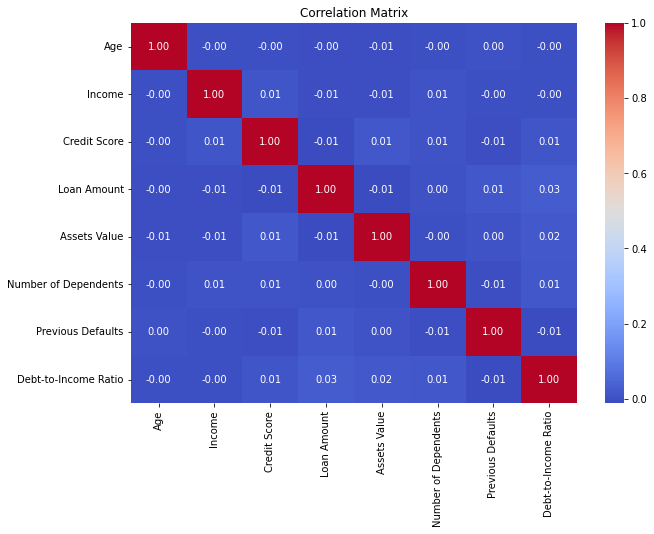

In [0]:
# Assemble numeric features into one vector
correlation_cols = [
    "Age", "Income", "Credit Score", "Loan Amount",
    "Assets Value", "Number of Dependents", "Previous Defaults", "Debt-to-Income Ratio"
]

assembler = VectorAssembler(inputCols=correlation_cols, outputCol="corr_features")
corr_df = assembler.transform(financial_df).select("corr_features")

# Compute Pearson correlation matrix
correlation_matrix = Correlation.corr(corr_df, "corr_features", "pearson").head()[0]

# Convert Spark matrix to Pandas for better display
corr_array = correlation_matrix.toArray()
corr_pd = pd.DataFrame(data=corr_array, columns=correlation_cols, index=correlation_cols)

# Show correlation heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(corr_pd, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()


###Unsupervised Learning By Using Cluster analysis

#####After completing the data cleaning and exploratory data analysis (EDA), we explore unsupervised learning to uncover hidden patterns and groupings within the dataset. Since the target variable (Risk_Rating) was available, I initially considered supervised methods, but I wanted to analyze whether natural groupings exist among applicants based purely on their features without relying on the target label. we use Kmeans clustering by excluding target variable

In [0]:
feature_cols = [
    "Age", "Income", "Credit Score", "Loan Amount",
    "Assets Value", "Number of Dependents", "Previous Defaults",
    "Gender_idx", "Education Level_idx", "Marital Status_idx",
    "Loan Purpose_idx", "Employment Status_idx", "Marital Status Change", "Payment History_idx", "Debt-to-Income Ratio", "Years at Current Job"
]
#merge all columns with in one vector column 
assembler = VectorAssembler(inputCols=feature_cols, outputCol="clust_features")
#create new dataframe for clusters
clust_df = assembler.transform(financial_df)
#create k=3 clusters
kmeans = KMeans(k=3, seed=1, featuresCol="clust_features", predictionCol="cluster")
#train kmeans model on the cluster data
kmeans_df = kmeans.fit(clust_df)
#assign cluster to each row
clustered_df = kmeans_df.transform(clust_df)
#select top 10 rows to cluster dataframe
clustered_df.select("cluster", "Risk Rating").show(10)


+-------+-----------+
|cluster|Risk Rating|
+-------+-----------+
|      0|        Low|
|      1|     Medium|
|      0|     Medium|
|      0|     Medium|
|      2|        Low|
|      0|     Medium|
|      0|        Low|
|      2|        Low|
|      2|        Low|
|      0|        Low|
+-------+-----------+
only showing top 10 rows



#### Cluster Performance Evaluation

In [0]:
#Evaluate Cluster quality by calculating silhouette score
evaluator = ClusteringEvaluator(predictionCol="cluster", featuresCol="clust_features", metricName="silhouette")
score = evaluator.evaluate(clustered_df)
print(f"🧠 Silhouette Score: {score:.4f}")


🧠 Silhouette Score: 0.6505


#####since the cluster quality Score is 0.65, it means there was a high degree of intra-cluster similarity and inter-cluster divergence. This demonstrates that the cluster feature, which identifies hidden structure in the dataset, is a suitable input for the classification model.

## Modeling Phase

##### As we were used Random Forest classifier in machine learning coursework so we will use same Random Forest model in this project too by using Spark 

######First we will use vectorAssembler to create single vector columns for Model input 

In [0]:
ml_features = [
    "Age", "Income", "Credit Score", "Loan Amount",
    "Assets Value", "Number of Dependents", "Previous Defaults",
    "Gender_idx", "Education Level_idx", "Marital Status_idx",
    "Loan Purpose_idx", "Employment Status_idx", "Marital Status Change", "Payment History_idx", "Debt-to-Income Ratio", "Years at Current Job", "cluster"
]

assembler = VectorAssembler(inputCols=ml_features, outputCol="model_features")
model_df = assembler.transform(clustered_df)


In [0]:
# Convert to Pandas
pandas_df = model_df.select("model_features", "Risk Rating_idx").toPandas()

# Convert vector to array
features_array = np.array(pandas_df["model_features"].tolist())
labels = pandas_df["Risk Rating_idx"]


/databricks/spark/python/pyspark/sql/pandas/conversion.py:119: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field model_features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


#####As we saw in the Data Frequency analysis, the target variable is unbalanced. To address this, we used SMOTE sampling because we had very low values for the High and Medium classes, which could be ignored by the model during training. This impacts the accuracy, as the model is not trained well on the minority classes. To balance them, we create realistic scenario data by analyzing their neighbors, so the minority class values increase and the model trains on them accurately.

In [0]:
smote_df = SMOTE(random_state=42)
X_resampled, y_resampled = smote_df.fit_resample(features_array, labels)


/local_disk0/.ephemeral_nfs/envs/pythonEnv-a7f87e0e-6def-45fd-ac7b-d8e7992597a1/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


In [0]:
# Create new Pandas DataFrame
resampled_df = pd.DataFrame(X_resampled, columns=ml_features)
resampled_df["Risk Rating_idx"] = y_resampled

# Convert back to Spark
resampled_spark_df = spark.createDataFrame(resampled_df)

######Final check how data looks like and where my target variable get balanced or not after using SMOTE

In [0]:
display(resampled_df)
resampled_df["Risk Rating_idx"].value_counts().sort_index()


Age,Income,Credit Score,Loan Amount,Assets Value,Number of Dependents,Previous Defaults,Gender_idx,Education Level_idx,Marital Status_idx,Loan Purpose_idx,Employment Status_idx,Marital Status Change,Payment History_idx,Debt-to-Income Ratio,Years at Current Job,cluster,Risk Rating_idx
49.0,72799.0,688.0,45713.0,120228.0,0.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,0.15431329631270066,19.0,0.0,0.0
57.0,69933.39850980393,690.0,33835.0,55849.0,0.0,3.0,1.0,0.0,0.0,3.0,0.0,2.0,3.0,0.14891964322471593,6.0,1.0,1.0
21.0,55687.0,600.0,36623.0,180700.0,3.0,3.0,0.0,3.0,2.0,1.0,0.0,2.0,3.0,0.36239801732546084,8.0,0.0,1.0
59.0,26508.0,622.0,26541.0,157319.0,3.0,4.0,2.0,0.0,2.0,0.0,2.0,2.0,1.0,0.45496438073379486,2.0,0.0,1.0
25.0,49427.0,766.0,36528.0,287140.0,2.0,3.0,0.0,0.0,0.0,0.0,2.0,1.0,3.0,0.14324242402046136,10.0,2.0,0.0
30.0,69933.39850980393,717.0,15613.0,159741.49717647058,4.0,3.0,0.0,2.0,1.0,2.0,2.0,1.0,3.0,0.2959844500430854,5.0,0.0,1.0
31.0,45280.0,672.0,6553.0,159741.49717647058,2.0,0.0,0.0,3.0,0.0,0.0,1.0,1.0,0.0,0.37888993741531785,1.0,0.0,0.0
18.0,93678.0,699.1090980392157,27450.010901960784,246597.0,1.0,1.0,2.0,0.0,0.0,2.0,2.0,1.0,2.0,0.3966357236164678,10.0,2.0,0.0
32.0,20205.0,710.0,27450.010901960784,227599.0,0.0,4.0,0.0,0.0,0.0,3.0,2.0,2.0,3.0,0.335964977578598,4.0,2.0,0.0
55.0,32190.0,600.0,29918.0,130507.0,4.0,2.0,2.0,0.0,3.0,0.0,1.0,2.0,1.0,0.48433330455936785,5.0,0.0,0.0


Out[25]: 0.0    9000
1.0    9000
2.0    9000
Name: Risk Rating_idx, dtype: int64

##### Create a feature column excluding the target variable Risk Rating_idx for training/testing

In [0]:
target_col = "Risk Rating_idx"

# Get all columns except the target
input_columns = [col for col in resampled_spark_df.columns if col != target_col]

assembler = VectorAssembler(inputCols=input_columns, outputCol="final_features")

final_df = assembler.transform(resampled_spark_df)


In [0]:
final_df.columns

Out[27]: ['Age',
 'Income',
 'Credit Score',
 'Loan Amount',
 'Assets Value',
 'Number of Dependents',
 'Previous Defaults',
 'Gender_idx',
 'Education Level_idx',
 'Marital Status_idx',
 'Loan Purpose_idx',
 'Employment Status_idx',
 'Marital Status Change',
 'Payment History_idx',
 'Debt-to-Income Ratio',
 'Years at Current Job',
 'cluster',
 'Risk Rating_idx',
 'final_features']

######Split data into 70/30 for Training/Testing

In [0]:
train_df, test_df = final_df.randomSplit([0.7, 0.3], seed=42)


##### i am using time function here to find the time how much random forest takes to train and test the data by using spark and check whether the spark is faster or not by comparing this with local machine time machine learning R studio project  

In [0]:
start = time.time()
rf = RandomForestClassifier(
    labelCol="Risk Rating_idx", 
    featuresCol="final_features",
    predictionCol="prediction"
)

rf_df = rf.fit(train_df)
predictions = rf_df.transform(test_df)
end = time.time()

In [0]:
evaluator = MulticlassClassificationEvaluator(
    labelCol="Risk Rating_idx", 
    predictionCol="prediction", 
    metricName="accuracy"
)

accuracy = evaluator.evaluate(predictions)
print(f"📊 Model Accuracy: {accuracy:.4f}")


📊 Model Accuracy: 0.5625


#####Since our accuracy is around 56%, similar to what we observed in the machine learning project, the reason might be that the variables do not contribute meaningful signals for classification, or that the actual values for some classes (Medium and High) are too low, leading to poor model performance.

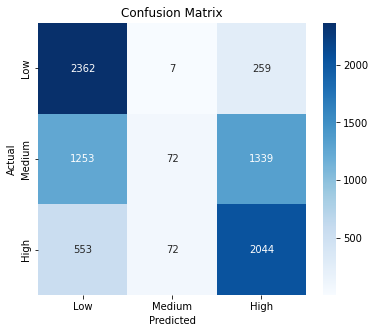

In [0]:
Confusion_matrix = predictions.select("prediction", "Risk Rating_idx").toPandas()

# Create confusion matrix
CM_df = confusion_matrix(Confusion_matrix["Risk Rating_idx"], Confusion_matrix["prediction"])

class_names = ["Low", "Medium", "High"]

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(CM_df, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()



In [0]:

kappa = cohen_kappa_score(Confusion_matrix["Risk Rating_idx"], Confusion_matrix["prediction"])
print(f"Cohen's Kappa Score: {kappa:.4f}")

Cohen's Kappa Score: 0.3445


#####The Cohen’s Kappa Score of 0.3445 achieved fair levels of agreement against chance for loan risk classification predictions. Additional optimization of imbalanced data processing and feature selection methods and different modeling methods could lead to better outcomes according to this moderate result.

In [0]:
print("Training/Testing Time by using (Spark):", round(end - start, 2), "seconds")

Training/Testing Time by using (Spark): 14.9 seconds
